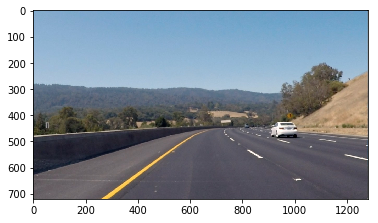

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

img = mpimg.imread('images/input/curved-lane.jpg')
plt.imshow(img)

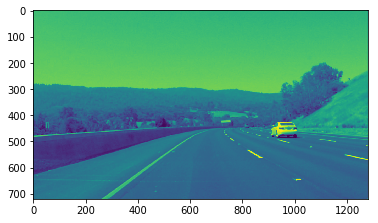

In [4]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray)

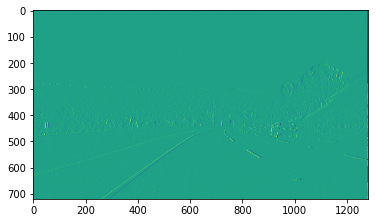

In [5]:
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
plt.imshow(sobelx)

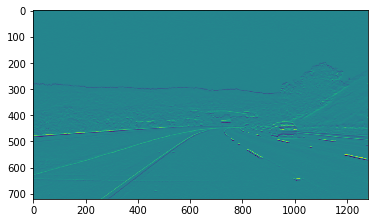

In [6]:
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
plt.imshow(sobely)

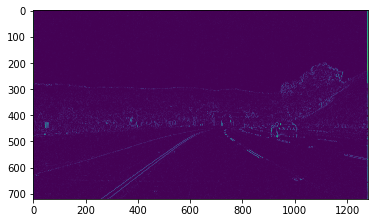

In [7]:
abs_sobelx = np.absolute(sobelx)
plt.imshow(abs_sobelx)

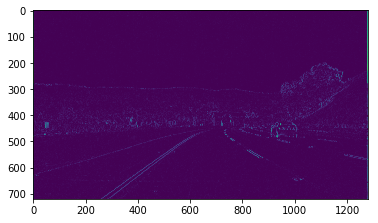

In [8]:
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
plt.imshow(scaled_sobel)

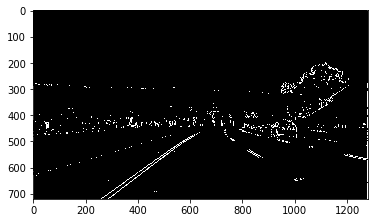

In [11]:
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
plt.imshow(sxbinary, cmap='gray')

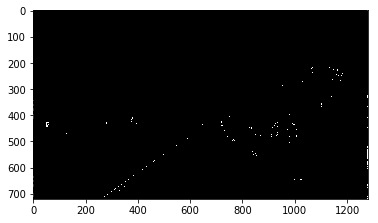

In [12]:
thresh_min = 50
thresh_max = 70
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
plt.imshow(sxbinary, cmap='gray')

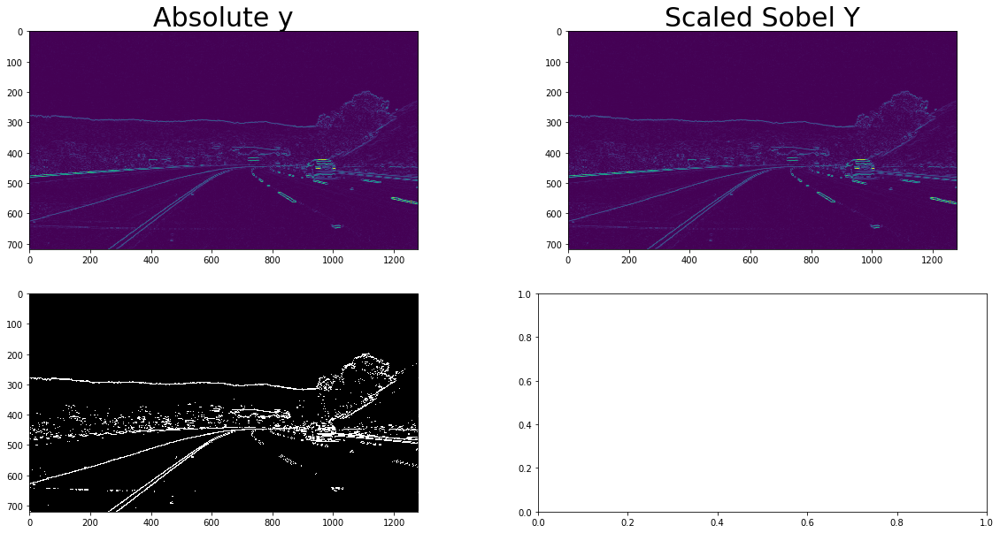

In [22]:
abs_sobely = np.absolute(sobely)

scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))

f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20,10))
ax1.imshow(abs_sobely)
ax1.set_title('Absolute y', fontsize=30)
ax2.imshow(scaled_sobely)
ax2.set_title('Scaled Sobel Y', fontsize=30)

thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobely)
sxbinary[(scaled_sobely >= thresh_min) & (scaled_sobely <= thresh_max)] = 1
ax3.imshow(sxbinary, cmap='gray')

In [72]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply cv2.Sobel()
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    if orient == 'x':
        # Take the absolute value of the output from cv2.Sobel()
        abs_sobel = np.absolute(sobelx)
    else:
        abs_sobel = np.absolute(sobely)
    # Scale the result to an 8-bit range (0-255)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Apply lower and upper thresholds
    thresh_min = 20
    thresh_max = 100
    # Create binary_output
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary

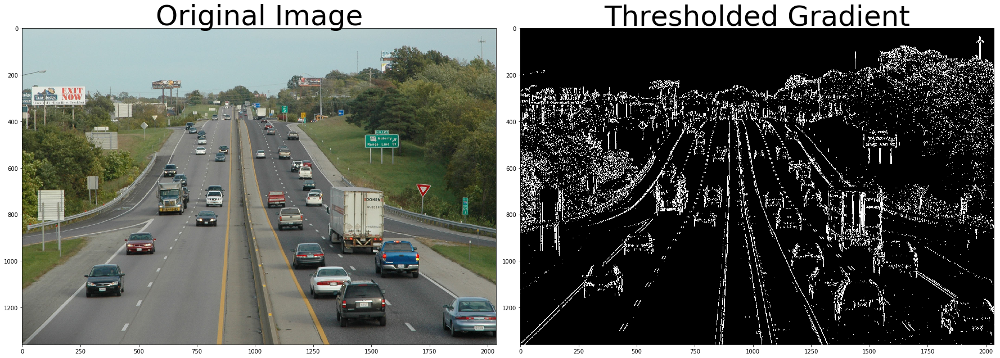

In [73]:
src = mpimg.imread('images/input/Cars_in_I-70,_KOMUnews.jpg')

grad_binary = abs_sobel_thresh(src, orient='x', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(src)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

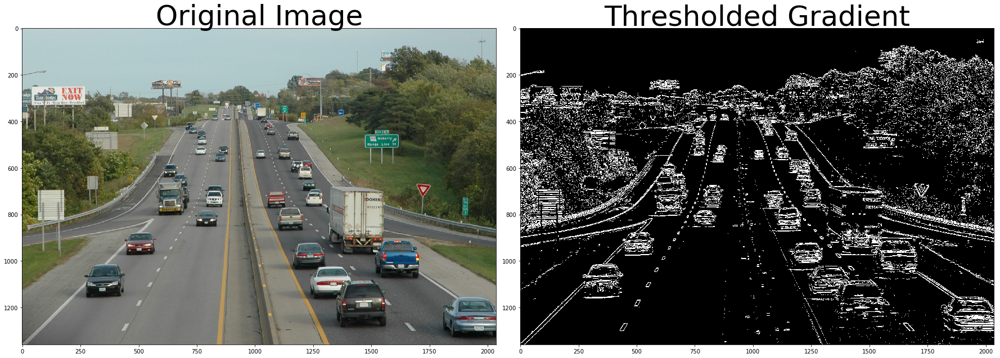

In [74]:
src = mpimg.imread('images/input/Cars_in_I-70,_KOMUnews.jpg')

grad_binary = abs_sobel_thresh(src, orient='y', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(src)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

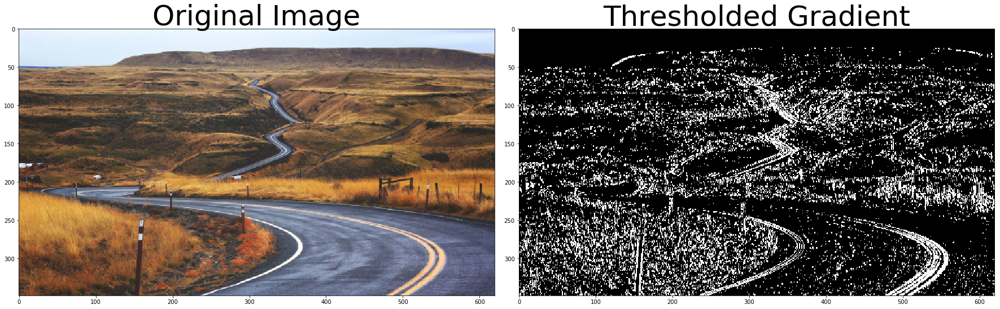

In [75]:
src = mpimg.imread('images/input/photo-1421218108559-eb1ff78357f5-620x349.jpg')

grad_binary = abs_sobel_thresh(src, orient='x', thresh_min=95, thresh_max=200)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(src)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

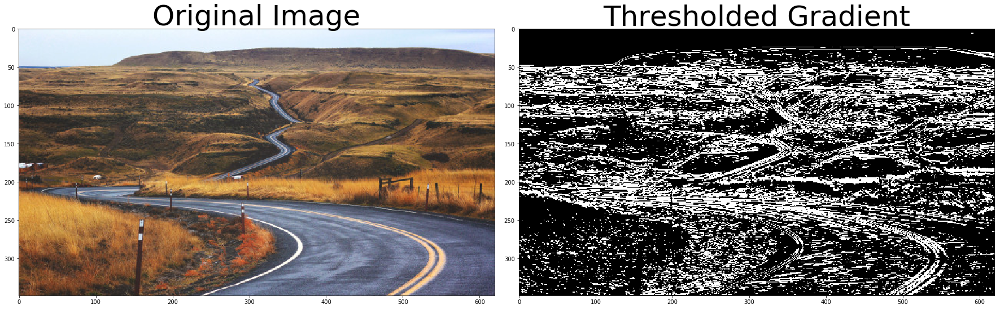

In [76]:
src = mpimg.imread('images/input/photo-1421218108559-eb1ff78357f5-620x349.jpg')

grad_binary = abs_sobel_thresh(src, orient='y', thresh_min=25, thresh_max=200)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(src)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Magnitude Threshold

----


In [77]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.max(gradmag)/255
    gradmag = (gradmag/scaled_sobel).astype(np.uint8) 
    # 5) Create a binary mask where mag thresholds are met
    binary_sobel = np.zeros_like(gradmag)
    binary_sobel[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_sobel

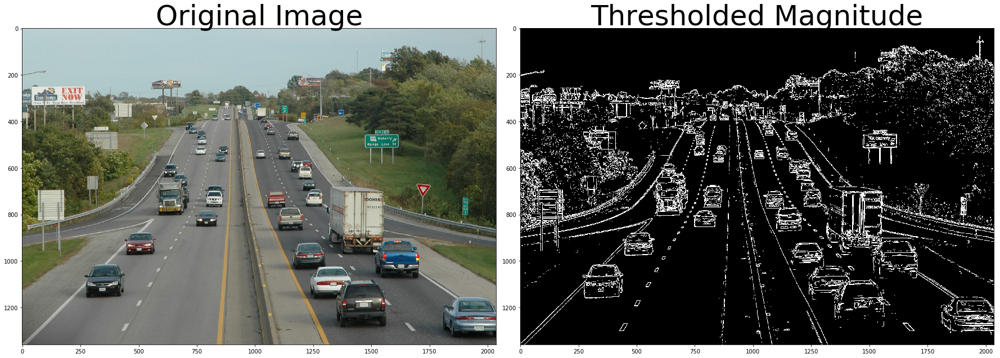

In [78]:
image = mpimg.imread('images/input/Cars_in_I-70,_KOMUnews.jpg')

mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

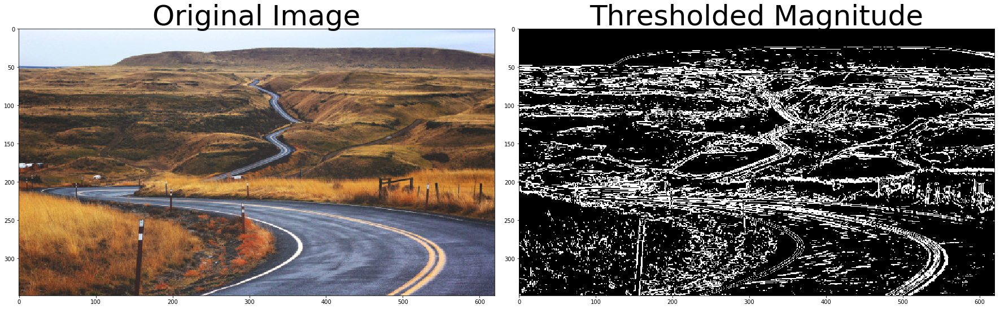

In [79]:
image = mpimg.imread('images/input/photo-1421218108559-eb1ff78357f5-620x349.jpg')

mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

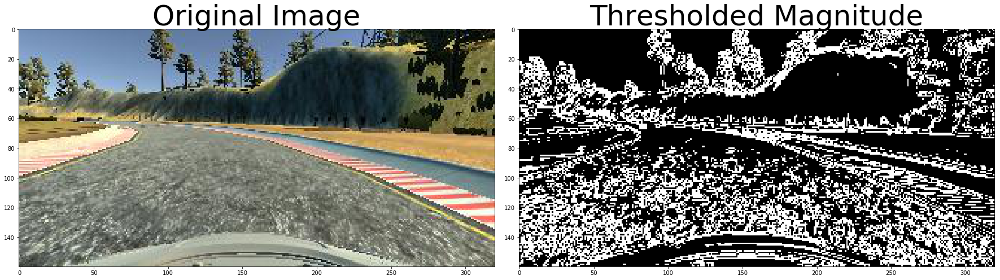

In [80]:
image = mpimg.imread('images/input/center_2017_07_21_15_14_11_115.jpg')

mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

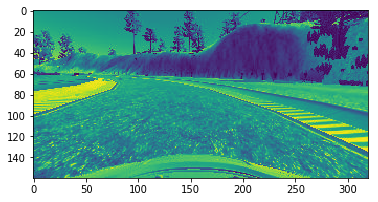

In [81]:
img = mpimg.imread('images/input/center_2017_07_21_15_14_11_115.jpg')
plt.imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray)

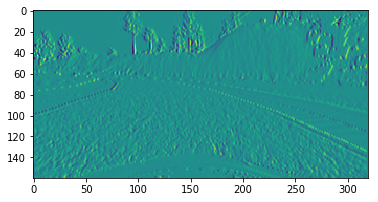

In [82]:
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
plt.imshow(sobelx)

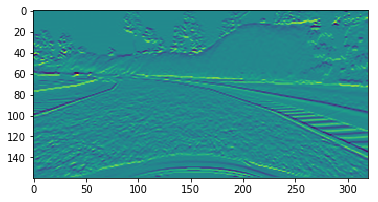

In [83]:
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
plt.imshow(sobely)

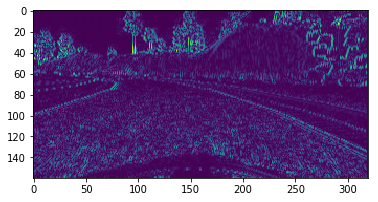

In [84]:
abs_sobelx = np.absolute(sobelx)
plt.imshow(abs_sobelx)

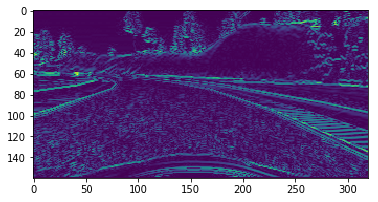

In [85]:
abs_sobely = np.absolute(sobely)
plt.imshow(abs_sobely)

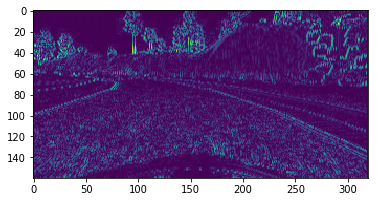

In [86]:
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
plt.imshow(scaled_sobel)

In [ ]:
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
plt.imshow(sxbinary, cmap='gray')

# Direction Threshold

-------


In [88]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

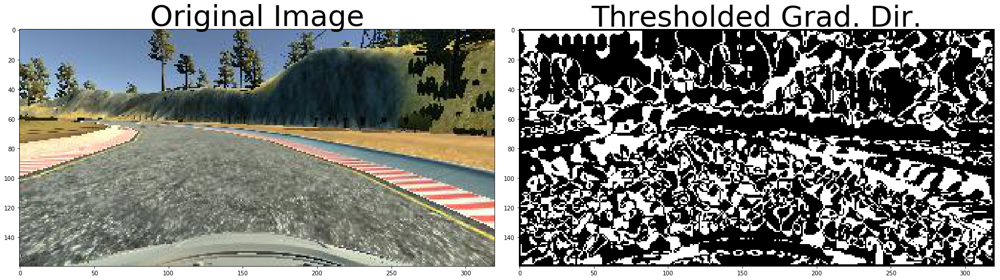

In [89]:
# Direction of the gradient

img = mpimg.imread('images/input/center_2017_07_21_15_14_11_115.jpg')

dir_binary = dir_threshold(image, sobel_kernel=27, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)

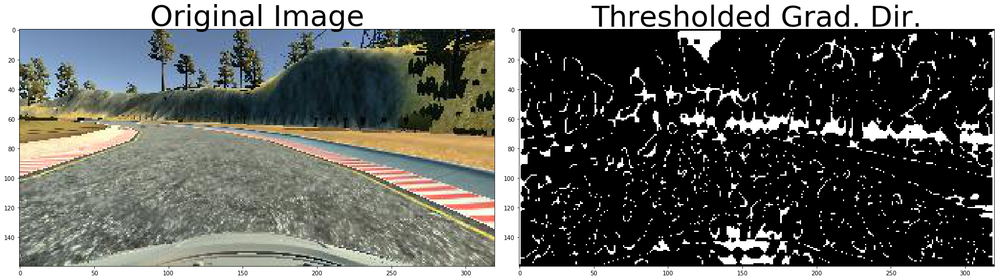

In [90]:
# Direction of the gradient

img = mpimg.imread('images/input/center_2017_07_21_15_14_11_115.jpg')

dir_binary = dir_threshold(image, sobel_kernel=27, thresh=(1.5, 1.9))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)

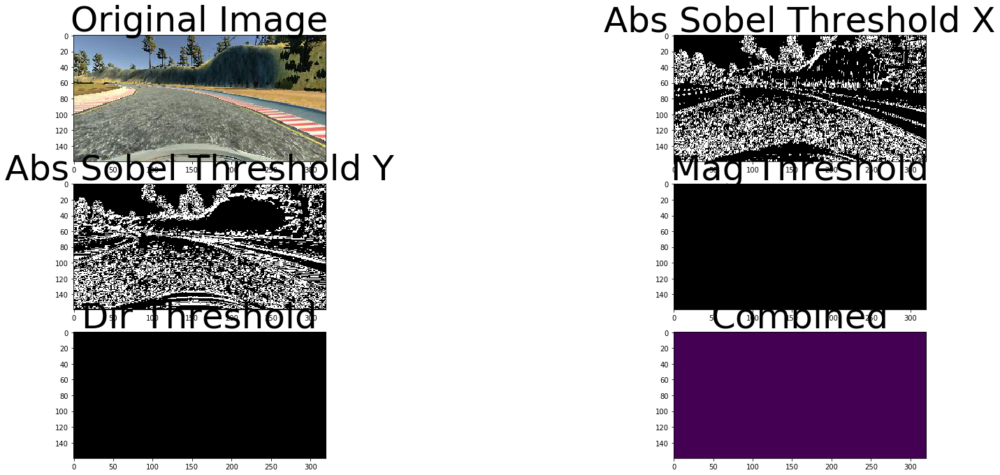

In [93]:
ksize = 3
image = mpimg.imread('images/input/center_2017_07_21_15_14_11_115.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(0, 255))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

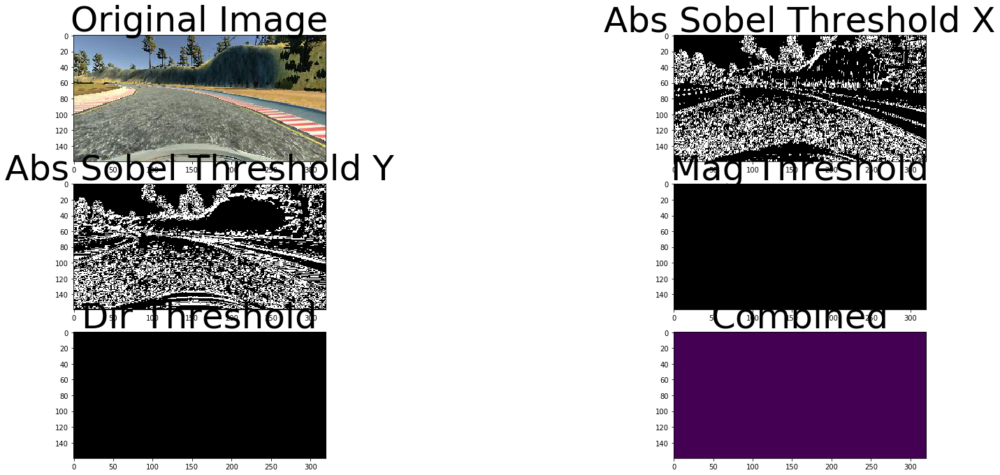

In [94]:
ksize = 3
image = mpimg.imread('images/input/center_2017_07_21_15_14_11_115.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(0, 255))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

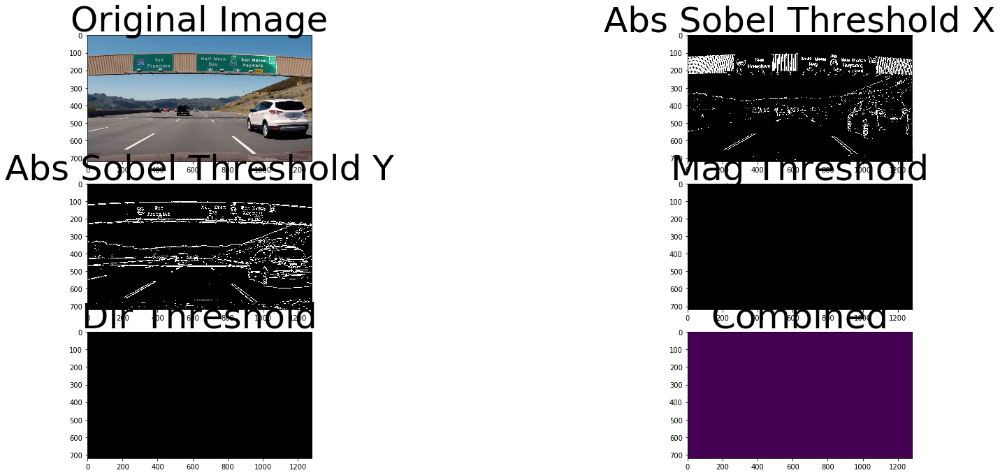

In [95]:
ksize = 3
image = mpimg.imread('images/input/signs_vehicles_xygrad.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(0, 255))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

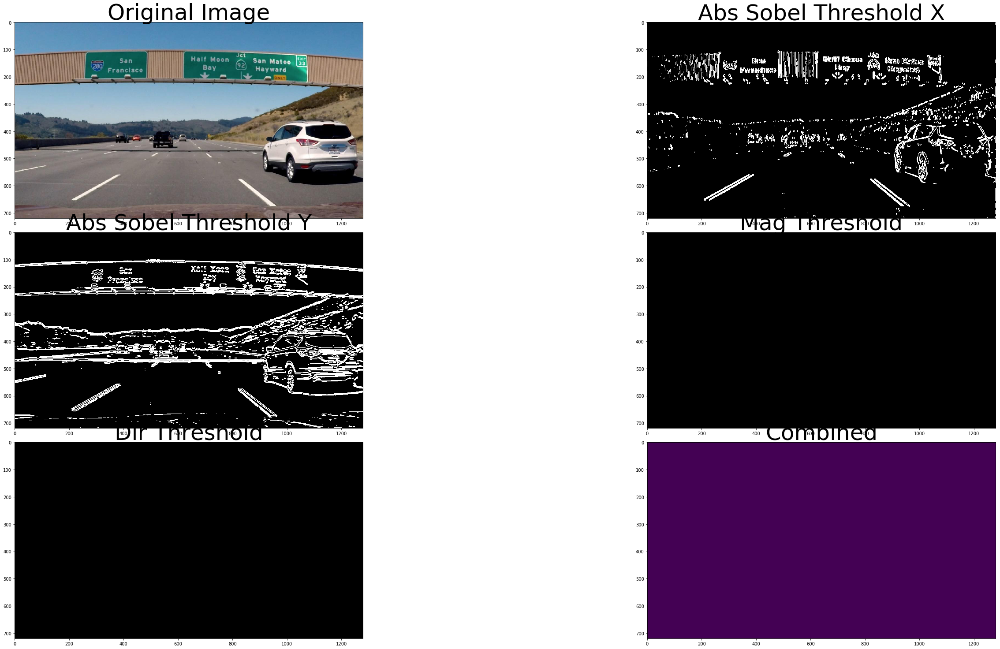

In [97]:
ksize = 15
image = mpimg.imread('images/input/signs_vehicles_xygrad.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(40, 20))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(0, 255))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

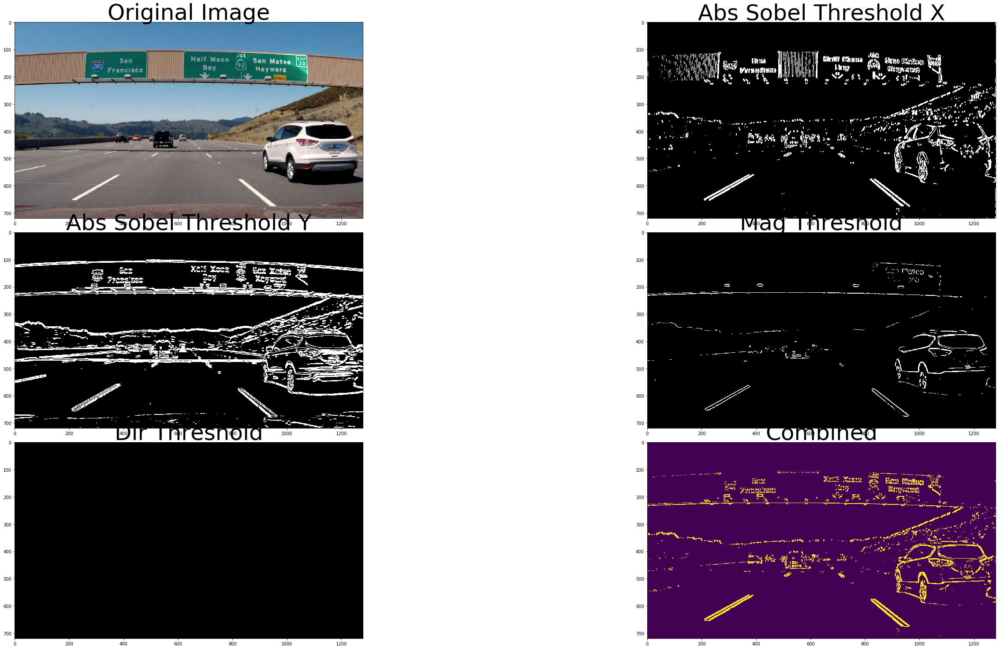

In [99]:
ksize = 15
image = mpimg.imread('images/input/signs_vehicles_xygrad.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(40, 20))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(100, 200))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

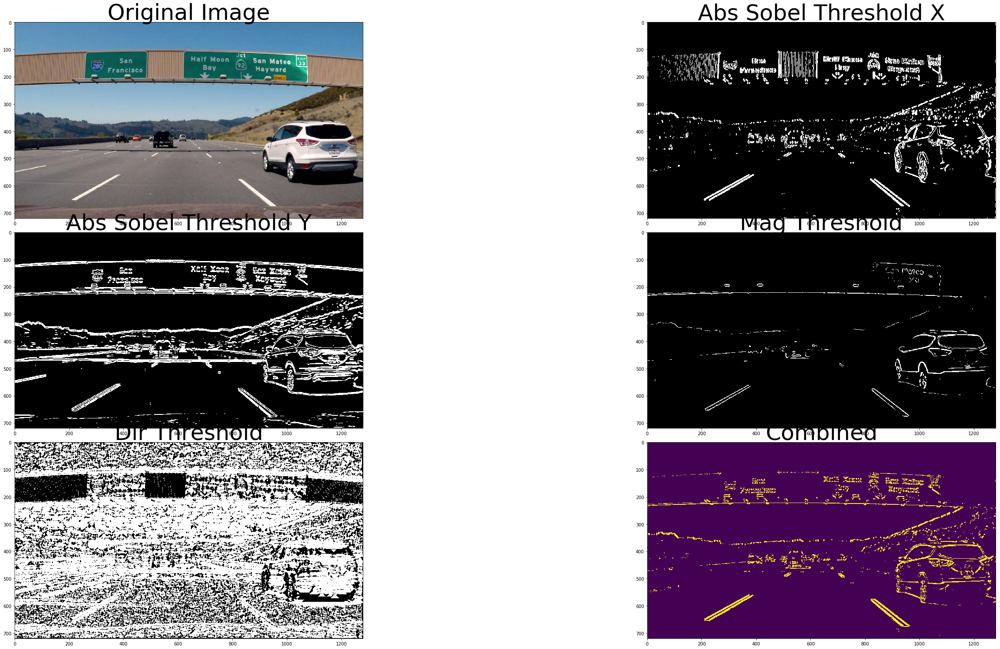

In [100]:
ksize = 15
image = mpimg.imread('images/input/signs_vehicles_xygrad.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(40, 20))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(100, 200))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(np.pi/4, np.pi/2))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

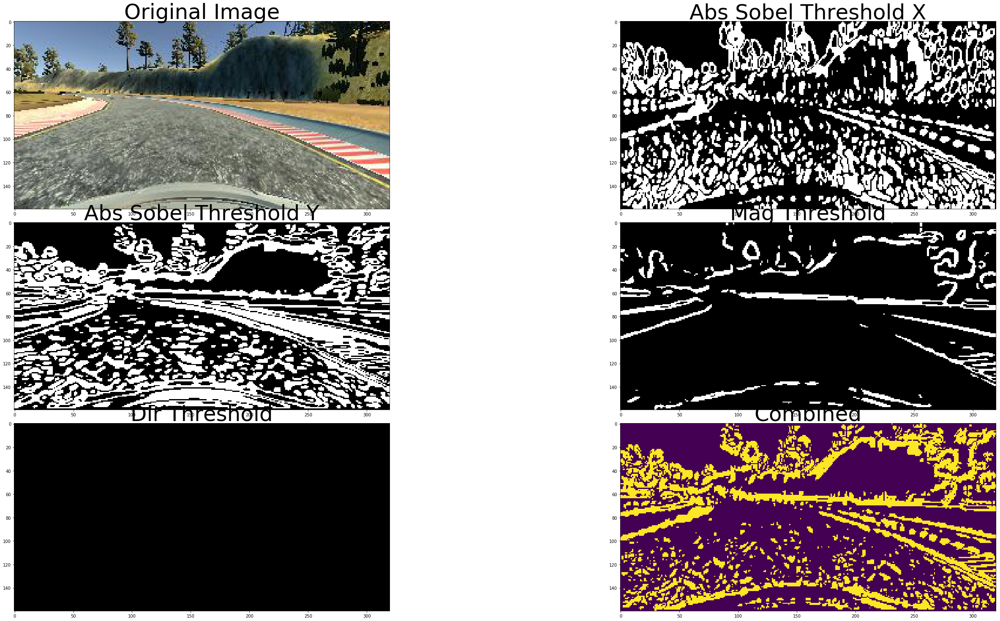

In [101]:
ksize = 15
image = mpimg.imread('images/input/center_2017_07_21_15_14_11_115.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(40, 20))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(100, 200))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

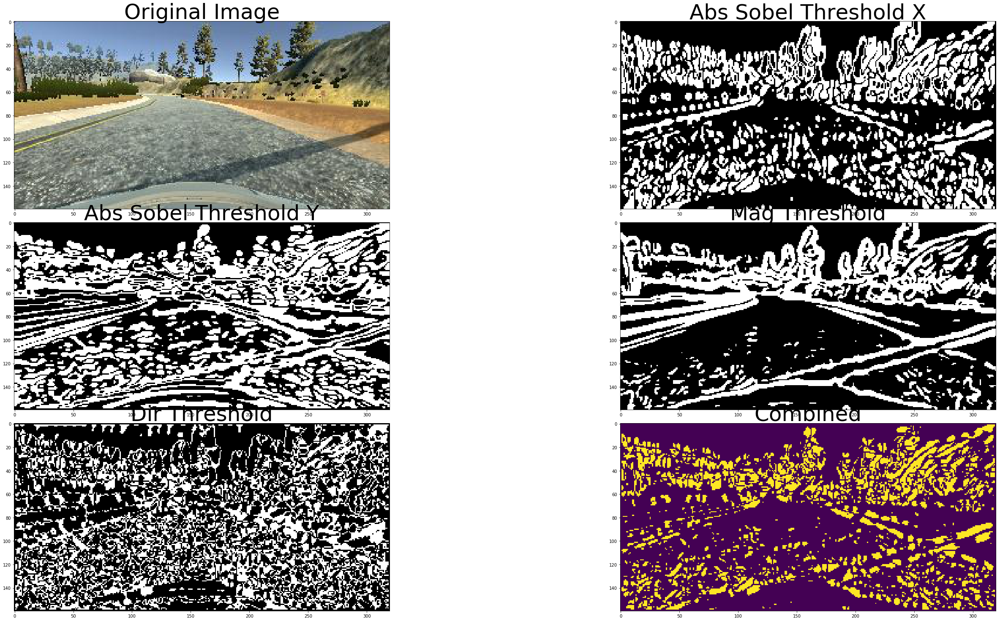

In [160]:
ksize = 15
image = mpimg.imread('images/input/center_2017_07_21_15_14_25_438_no_border.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(40, 20))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(50, 200))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

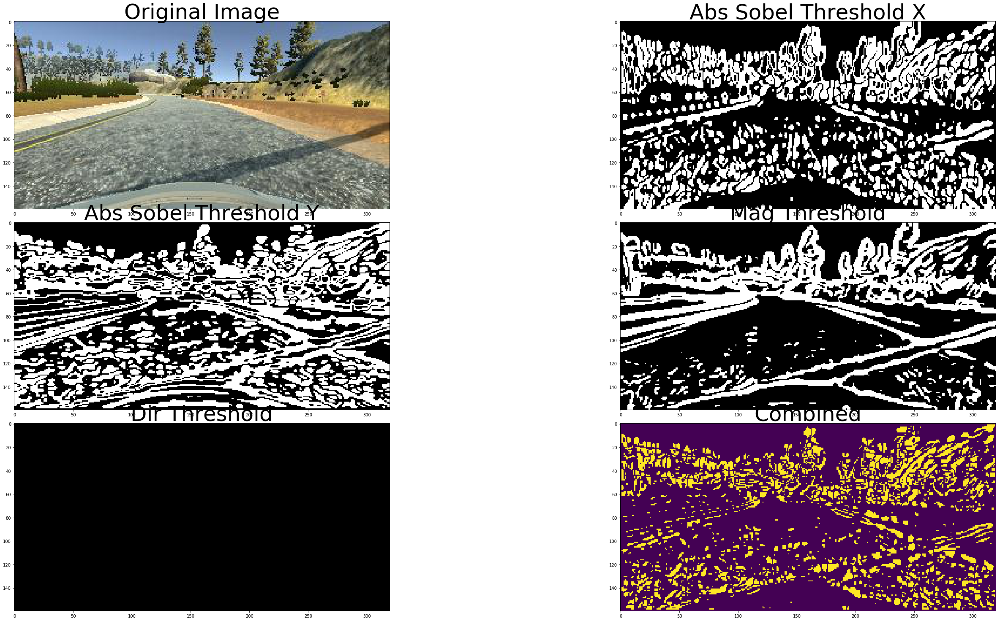

In [107]:
ksize = 15
image = mpimg.imread('images/input/center_2017_07_21_15_14_25_438_no_border.jpg')

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(40, 20))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)


gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Abs Sobel Threshold X', fontsize=50)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh_min=0, thresh_max=255)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Abs Sobel Threshold Y', fontsize=50)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(50, 200))
ax4.imshow(mag_binary, cmap='gray')
ax4.set_title('Mag Threshold', fontsize=50)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=((3*(np.pi/4)), np.pi))
ax5.imshow(dir_binary, cmap='gray')
ax5.set_title('Dir Threshold', fontsize=50)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
ax6.imshow(combined, cmap='gray')
ax6.set_title('Combined', fontsize=50)

plt.imshow(combined)

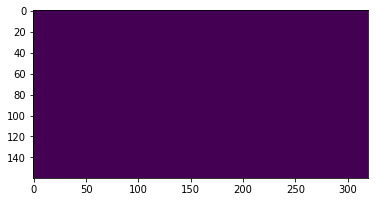

In [110]:
ksize = 5
image = mpimg.imread('images/input/center_2017_07_21_15_14_25_438_no_border.jpg')
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=((0), np.pi))
plt.imshow(dir_binary)

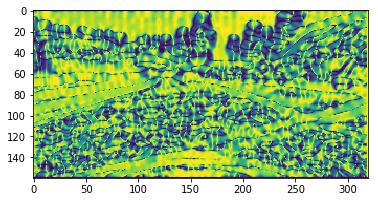

In [146]:
sobel_kernel = 15
img = mpimg.imread('images/input/center_2017_07_21_15_14_25_438_no_border.jpg')

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# Calculate the x and y gradients
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
# Take the absolute value of the gradient direction, 
# apply a threshold, and create a binary image result
absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))

plt.imshow(absgraddir)

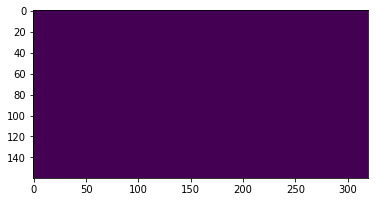

In [147]:
binary_output =  np.zeros_like(absgraddir)
plt.imshow(binary_output)

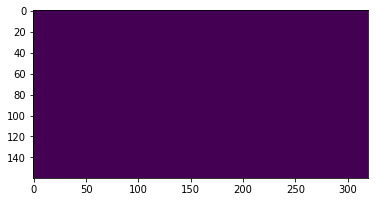

In [148]:
thresh = (0, np.pi)
binary_output[(absgraddir >= 0) & (absgraddir <= thresh[1])] = 1
plt.imshow(binary_output)

In [149]:
print(absgraddir[1])

[ 1.57079633  0.99400107  0.77172764  0.86167306  1.34046501  1.27404887
  1.07538771  1.08028715  1.23281113  1.44689739  1.55873441  1.53275001
  1.55274322  1.56829439  1.54195047  1.48359496  1.37339449  1.21823706
  1.05832237  0.93998118  0.88657599  0.89767114  0.952178    1.00938712
  1.03436507  1.02816171  1.01664248  1.02381478  1.06289906  1.13359173
  1.21223641  1.25286235  1.22463662  1.14860984  1.07711552  1.04740712
  1.06966173  1.13482595  1.21231059  1.25281183  1.22457122  1.14852939
  1.07702435  1.04731419  1.06957959  1.13477196  1.21229905  1.25284029
  1.22462771  1.14860642  1.07711489  1.04740868  1.06966758  1.13484164
  1.2123416   1.25285939  1.2246352   1.14863968  1.07752242  1.05010141
  1.08165209  1.17442355  1.30990132  1.42687438  1.44157904  1.31953293
  1.12783081  0.98473723  0.95858465  1.07962929  1.3455264   1.53006576
  1.46480708  1.50175671  1.21277941  0.99730734  0.91169468  0.93417889
  1.03405462  1.1544681   1.21126087  1.16173437  1

In [150]:
print(np.max(absgraddir[1]))

1.57079632679


In [151]:
print(np.max(absgraddir[2]))

1.57079632679


In [152]:
print(np.max(absgraddir[80]))

1.57079632679


In [153]:
print(absgraddir[40] == absgraddir[80])

[ True False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False Fa

In [154]:
print(np.max(absgraddir[159]))

0.0


In [155]:
print(np.max(absgraddir[120]))

1.57079632679


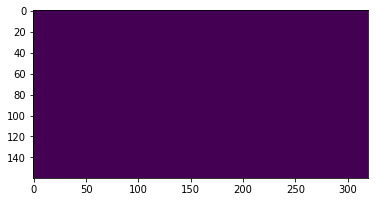

In [157]:
thresh = (0, np.pi)
binary_output[(absgraddir >= 0) & (absgraddir <= 3.14)] = 1
plt.imshow(binary_output)

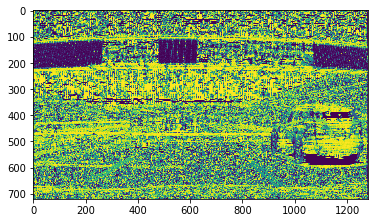

In [134]:
sobel_kernel=7
img = mpimg.imread('images/input/signs_vehicles_xygrad.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# Calculate the x and y gradients
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
# Take the absolute value of the gradient direction, 
# apply a threshold, and create a binary image result
absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))

plt.imshow(absgraddir)

In [135]:
print(np.max(absgraddir[1]))

1.57079632679


In [136]:
print(absgraddir[1])

[ 1.57079633  0.59208702  0.44533188 ...,  0.36836092  0.41476715
  1.57079633]


In [137]:
print(len(absgraddir[1]))

1280


In [138]:
print(len(absgraddir))

720


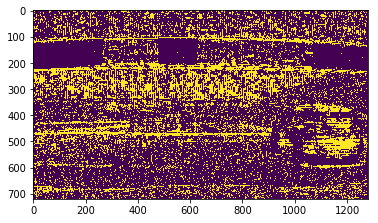

In [144]:
thresh = (0, np.pi)
binary_output =  np.zeros_like(absgraddir)
binary_output[(absgraddir >= 1.4) & (absgraddir <= 1.7)] = 1
plt.imshow(binary_output)

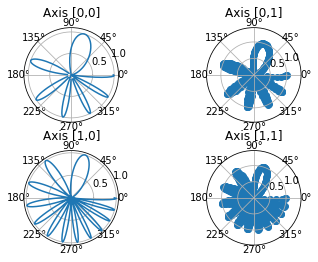

In [159]:
# Simple data to display in various forms
x = np.linspace(0, 2 * np.pi, 400)
y = np.sin(x ** 2)

# Four polar axes
f, axarr = plt.subplots(2, 2, subplot_kw=dict(projection='polar'))
axarr[0, 0].plot(x, y)
axarr[0, 0].set_title('Axis [0,0]')
axarr[0, 1].scatter(x, y)
axarr[0, 1].set_title('Axis [0,1]')
axarr[1, 0].plot(x, y ** 2)
axarr[1, 0].set_title('Axis [1,0]')
axarr[1, 1].scatter(x, y ** 2)
axarr[1, 1].set_title('Axis [1,1]')
# Fine-tune figure; make subplots farther from each other.
f.subplots_adjust(hspace=0.3)

plt.show()